# Fake new detection project

Pipeline of this project:
1.Problem understanding

2.data colllection

3.data explore

4.data preprocessing

5.tokenizer(use keras)

6.model building & Evaluation

7. Hyparparameter tuning

8.save and deploy the model

Step 1:Problem Understanding
Problem=> classify weather given new article is fake or real

input=>text(title,content,both(title,content))

output=>Binary value(Fake/real)

# Step 2: Data collection
we are using the dataset

ISOT FAKE NEW DATASET
the ISOT Fake News Dataset contains two separate CSV files:

True.csv → Contains real news articles.

Columns: title, text

Every row represents a real news article.

Fake.csv → Contains fake news articles.

Columns: title, text

Every row represents a fake news article.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
# load the datset
df_real=pd.read_csv("/content/True.csv")
df_fake=pd.read_csv("/content/Fake.csv")

In [3]:
df_real.head(4)

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"


In [4]:
df_fake.head(5)

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


Subject / Date / Source / Author:

These are not necessary for text-based classification.

You can safely drop them before training.

They may introduce noise or bias if the model learns patterns like “all news from a certain date/source = real/fake.”

In [5]:
# we drop the subject and date column .we are not effect the training and inference(prediction).
df_real = df_real[["title", "text"]]
df_fake = df_fake[["title", "text"]]

In [6]:
df_real.head(2)

,title,text
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...


merge the dataset into one single csv file

In [7]:
# Add labels: 1 = real, 0 = fake
df_real["label"] = 1
df_fake["label"] = 0

In [8]:
df_real.head(2)

,title,text,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,1


In [9]:
df_fake.head(2)

,title,text,label
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,0


In [10]:
# Combine & shuffle
df = pd.concat([df_real, df_fake], ignore_index=True)
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [11]:
df.head()

,title,text,label
0,BREAKING: GOP Chairman Grassley Has Had Enoug...,"Donald Trump s White House is in chaos, and th...",0
1,Failed GOP Candidates Remembered In Hilarious...,Now that Donald Trump is the presumptive GOP n...,0
2,Mike Pence’s New DC Neighbors Are HILARIOUSLY...,Mike Pence is a huge homophobe. He supports ex...,0
3,California AG pledges to defend birth control ...,SAN FRANCISCO (Reuters) - California Attorney ...,1
4,AZ RANCHERS Living On US-Mexico Border Destroy...,Twisted reasoning is all that comes from Pelos...,0


In [12]:
df.sample(5)

,title,text,label
20286,LOL! Costco Puts Hillary In “Milk Aisle” For B...,Laura Loomer decided to make a trip to Brookfi...,0
34594,U.S. says ban-the-bomb Nobel winner won't make...,OSLO (Reuters) - The Nobel Peace Prize winner ...,1
30336,U.S. Holocaust museum alarmed over 'hateful sp...,WASHINGTON (Reuters) - The U.S. Holocaust Memo...,1
25199,FLASHBACK! BILL CLINTON: “I did not have sexua...,,0
15694,"Illinois to sell bonds, but cannot tap all the...",CHICAGO (Reuters) - Illinois will sell $550 mi...,1


In [13]:
df['content'] = df['title'] + " " + df['text']
df = df[['content', 'label']]


In [14]:
df.head(2)

,content,label
0,BREAKING: GOP Chairman Grassley Has Had Enoug...,0
1,Failed GOP Candidates Remembered In Hilarious...,0


In [15]:
df.shape

(44898, 2)

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44898 entries, 0 to 44897
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   content  44898 non-null  object
 1   label    44898 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 701.7+ KB


In [17]:
df.isnull().sum()

,0
content,0
label,0


In [18]:
df = df.dropna()  # drop rows with NaN
df = df[df['content'].str.strip() != ""]  # remove empty strings


In [19]:
df.head(2)

,content,label
0,BREAKING: GOP Chairman Grassley Has Had Enoug...,0
1,Failed GOP Candidates Remembered In Hilarious...,0


In [20]:
print(df['label'].value_counts())

label
0    23481
1    21417
Name: count, dtype: int64


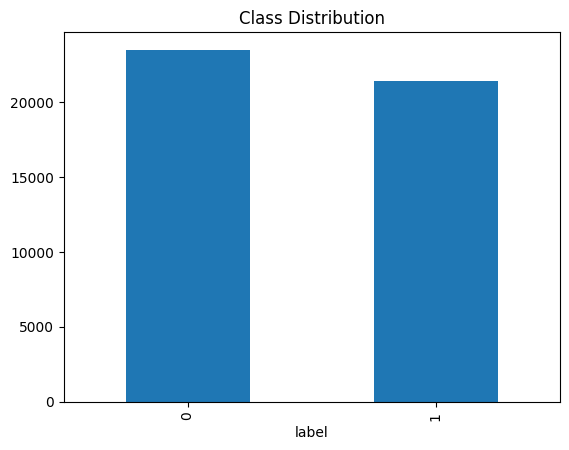

In [21]:

df['label'].value_counts().plot(kind='bar', title="Class Distribution")
plt.show()


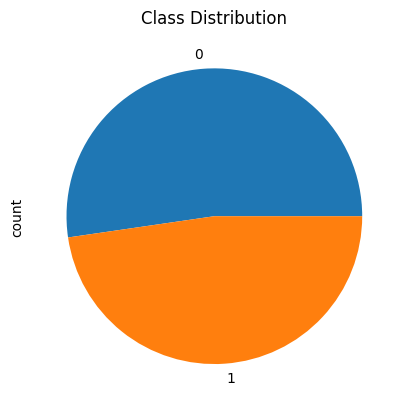

In [22]:

df['label'].value_counts().plot(kind='pie', title="Class Distribution")
plt.show()


In [23]:
df.head(1)

,content,label
0,BREAKING: GOP Chairman Grassley Has Had Enoug...,0


In [24]:
print("Sample fake news:\n", df[df['label']==0].sample(1)['content'].values[0])
print("Sample real news:\n", df[df['label']==1].sample(1)['content'].values[0])


Sample fake news:
  Trump Just Outed Himself As YUUUGE Liar After Saying He Saw U.S. Plane Unloading Money To Iran Oh, Donald Trump. The pathological liar has struck again, although everyone should have seen this coming. At a rally in Daytona Beach, he made an absurd claim that he saw  top secret  footage of a U.S. plane unloading $400 million in payment to Iran the same day that four American detainees were released. Of course, he later used Twitter to try and backpedal, but all he really did was admit that he lied through his teeth:The plane I saw on television was the hostage plane in Geneva, Switzerland, not the plane carrying $400 million in cash going to Iran!  Donald J. Trump (@realDonaldTrump) August 5, 2016The tape that he saw allegedly came from Iran, and he made it out to be some kind of taunt on their part: It was interesting because a tape was made. Right? You saw that? With the airplane coming in   nice plane   and the airplane coming in, and the money coming off, I guess

# Step 4: Data Preprocessing
Lowercasing

Removing punctuation, special characters, numbers

Removing extra spaces

Optional: remove stopwords

In [25]:
def lower(text):
  text=text.lower()
  return text

In [26]:
df['content'] = df['content'].apply(lower)

In [27]:
df['content'].head(2)

,content
0,breaking: gop chairman grassley has had enoug...
1,failed gop candidates remembered in hilarious...


In [28]:
import re
import string
exclude=string.punctuation
def clean_text(text):
  text=re.sub(r'\d+', '', text)
  text=text.translate(str.maketrans('','',exclude))
  return text

In [29]:
df['content'] = df['content'].apply(clean_text)

In [30]:
df['content'].sample(2)

,content
25214,judge dismisses case against north carolinas g...
10458,hands on dhs secretary john kelly tours border...


In [31]:
import re
def remove_space(text):
  text = re.sub(r'\s+', ' ', text).strip()
  return text

In [32]:
df['content'] = df['content'].apply(remove_space)

In [33]:
df['content'].sample(4)

,content
15303,former president carter hospitalized over dehy...
807,trump spoke by phone to egypts sisi to discuss...
41114,trump praises saudi purge voices confidence in...
18773,white house rejects report critical of republi...


# Tokenization & Padding

In [34]:
df.head()

,content,label
0,breaking gop chairman grassley has had enough ...,0
1,failed gop candidates remembered in hilarious ...,0
2,mike pence’s new dc neighbors are hilariously ...,0
3,california ag pledges to defend birth control ...,1
4,az ranchers living on usmexico border destroy ...,0


In [64]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer

count the vocabulary

In [66]:
vocab_size = 30000  # Limit vocabulary for speed
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")

apply

In [67]:
tokenizer.fit_on_texts(df['content'])

count the word index

In [68]:
print(tokenizer.word_index)

{'<OOV>': 1, 'the': 2, 'to': 3, 'of': 4, 'a': 5, 'and': 6, 'in': 7, 'that': 8, 'on': 9, 'for': 10, 's': 11, 'is': 12, 'he': 13, 'said': 14, 'trump': 15, 'it': 16, 'with': 17, 'was': 18, 'as': 19, 'his': 20, 'by': 21, 'has': 22, 'be': 23, 'have': 24, 'not': 25, 'from': 26, 'at': 27, 'this': 28, 'are': 29, 'who': 30, 'us': 31, 'an': 32, 'they': 33, 'but': 34, 'would': 35, 'we': 36, 'i': 37, 'president': 38, 'about': 39, 'will': 40, 'their': 41, 'had': 42, 'you': 43, 't': 44, 'been': 45, 'people': 46, 'were': 47, 'or': 48, 'more': 49, 'after': 50, 'which': 51, 'she': 52, 'her': 53, 'one': 54, 'out': 55, 'if': 56, 'all': 57, 'what': 58, 'new': 59, 'state': 60, 'when': 61, 'its': 62, 'also': 63, 'up': 64, 'over': 65, 'no': 66, 'there': 67, 'house': 68, 'reuters': 69, 'donald': 70, 'clinton': 71, 'our': 72, 'obama': 73, 'government': 74, 'can': 75, 'just': 76, 'states': 77, 'him': 78, 'than': 79, 'so': 80, 'republican': 81, 'other': 82, 'some': 83, 'could': 84, 'white': 85, 'into': 86, 'unit

total word

In [69]:
print(tokenizer.word_counts)

OrderedDict({'breaking': 1859, 'gop': 5027, 'chairman': 3780, 'grassley': 513, 'has': 89310, 'had': 46253, 'enough': 4784, 'demands': 1048, 'trump': 127769, 'jr': 1728, 'testimony': 1244, 'donald': 28386, 's': 176510, 'white': 23764, 'house': 28810, 'is': 169090, 'in': 353906, 'chaos': 949, 'and': 410145, 'they': 66473, 'are': 73344, 'trying': 5826, 'to': 551682, 'cover': 1824, 'it': 124627, 'up': 30090, 'their': 47540, 'russia': 13441, 'problems': 2087, 'mounting': 279, 'by': 96903, 'the': 1012732, 'hour': 1267, 'refuse': 770, 'acknowledge': 389, 'that': 237413, 'there': 29133, 'surrounding': 894, 'all': 33778, 'of': 448824, 'this': 75987, 'them': 21227, 'fake': 3580, 'news': 20847, 'or': 40087, 'a': 411533, 'hoax': 357, 'however': 6182, 'facts': 1654, 'bear': 478, 'things': 5835, 'out': 34447, 'differently': 216, 'seems': 2928, 'now': 19551, 'cracks': 83, 'congressional': 3898, 'public': 11973, 'leadershipchuck': 1, 'riowa': 20, 'who': 70974, 'heads': 1096, 'senate': 13335, 'judiciar

In [70]:
print(tokenizer.word_docs)

defaultdict(<class 'int'>, {'differently': 204, 'anyone': 3765, 'just': 15247, 'images': 4386, 'republic': 839, 'testify': 427, 'hostile': 583, 'grassley': 234, 'chairman': 2801, 'or': 19697, 'birtherism': 33, 'their': 21071, 'hour': 948, 'demanding': 798, 'takeover': 198, 'acknowledge': 362, 'riowa': 20, 'only': 12782, 'cracks': 81, 'and': 41930, 'senate': 5523, 'like': 13399, 'trying': 4799, 'warningalso': 1, 'corruption': 1267, 'white': 10716, 'fake': 1667, 'however': 5174, 'surrounding': 799, 'congress': 5683, 'scandalridden': 20, 'breaking': 1706, 'what': 17685, 'isn': 2995, 'we': 20903, 'leadershipchuck': 1, 'win': 3971, 'presidential': 8839, 'worlds': 55, 'seems': 2509, 'signals': 245, 'angry': 1171, 'despite': 3809, 'of': 42460, 'few': 4343, 'clinton': 7321, 'lawyer': 1795, 'dirt': 170, 'will': 21950, 'they': 24032, 'due': 3406, 'democratic': 7800, 'infamous': 321, 'couragefeatured': 1, 'meeting': 4394, 'carries': 260, 'jr': 863, 'serious': 2392, 'staged': 349, 'promised': 1543

number of document in the text

In [71]:
print(tokenizer.document_count)

44898


to convert the text in number

In [72]:
sequence=tokenizer.texts_to_sequences(df['content'])

In [73]:
print(sequence[0])

[1219, 430, 588, 3527, 22, 42, 455, 1987, 15, 1314, 1705, 70, 15, 11, 85, 68, 12, 7, 2173, 6, 33, 29, 349, 3, 1240, 16, 64, 41, 148, 1087, 29, 5399, 21, 2, 1682, 6, 33, 2568, 3, 4313, 8, 67, 29, 1087, 2293, 57, 4, 28, 3, 94, 16, 11, 624, 95, 48, 5, 4583, 324, 2, 1369, 3700, 348, 55, 6383, 6, 16, 787, 8, 67, 29, 102, 11349, 7, 2, 568, 170, 1, 3527, 24485, 30, 1905, 2, 150, 1694, 225, 12, 1815, 64, 13, 12, 102, 2316, 8, 70, 15, 1314, 6, 106, 15, 93, 1407, 581, 1842, 2944, 116, 20, 225, 1252, 2, 102, 4677, 6817, 252, 158, 70, 15, 6, 2, 6817, 193, 834, 30, 1278, 6609, 9, 152, 141, 429, 108, 71, 7, 289, 28, 281, 12, 546, 192, 102, 28, 1529, 4858, 5, 416, 5540, 3, 442, 15, 124, 5226, 8, 33, 111, 25, 726, 481, 1288, 991, 1438, 143, 97, 2997, 507, 2, 289, 8, 16, 787, 8, 28, 787, 3, 23, 58, 15, 11, 85, 68, 12, 6161, 2, 10982, 80, 3, 935, 3, 91, 19, 36, 1, 12, 2, 748, 1252, 3527, 11, 1, 492, 30, 1333, 8, 238, 3527, 6, 2, 1214, 4, 2, 150, 29, 25, 828, 39, 28, 104, 628, 3, 381, 27, 2, 1499, 8, 22,

In [74]:
print(len(sequence[0]))

370


In [75]:
print(len(sequence[1])) # length of the text

501


find the max_len this si crucial parameter to perform the padding

In [77]:
lengths = [len(seq) for seq in sequence]

# Use 95th percentile instead of max length
max_len = int(np.percentile(lengths, 95))
print("95th percentile max_len:", max_len)

95th percentile max_len: 903


to apply the padding to the same length input because neural network ascept the same length of input

In [78]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
padded=pad_sequences(sequence,maxlen=max_len,padding='post',truncating='post')

In [79]:
padded[0]

array([ 1219,   430,   588,  3527,    22,    42,   455,  1987,    15,
        1314,  1705,    70,    15,    11,    85,    68,    12,     7,
        2173,     6,    33,    29,   349,     3,  1240,    16,    64,
          41,   148,  1087,    29,  5399,    21,     2,  1682,     6,
          33,  2568,     3,  4313,     8,    67,    29,  1087,  2293,
          57,     4,    28,     3,    94,    16,    11,   624,    95,
          48,     5,  4583,   324,     2,  1369,  3700,   348,    55,
        6383,     6,    16,   787,     8,    67,    29,   102, 11349,
           7,     2,   568,   170,     1,  3527, 24485,    30,  1905,
           2,   150,  1694,   225,    12,  1815,    64,    13,    12,
         102,  2316,     8,    70,    15,  1314,     6,   106,    15,
          93,  1407,   581,  1842,  2944,   116,    20,   225,  1252,
           2,   102,  4677,  6817,   252,   158,    70,    15,     6,
           2,  6817,   193,   834,    30,  1278,  6609,     9,   152,
         141,   429,

In [80]:
print(len(padded[0]))

903


In [81]:
print(len(padded[1]))

903


the input size are same all text

In [82]:
print(len(padded))

44898


to perform the train test split

In [83]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(padded, df['label'], test_size=0.2, random_state=42)

In [84]:
print(X_train.shape,y_train.shape)

(35918, 903) (35918,)


In [85]:
X_train

array([[ 2896, 20712,  1160, ...,     0,     0,     0],
       [ 2634,   644,   438, ...,     0,     0,     0],
       [ 3873,     9,   155, ...,     0,     0,     0],
       ...,
       [   15,   154,   183, ...,     0,     0,     0],
       [  215,   145,    22, ...,     0,     0,     0],
       [  782,    59,  2092, ...,     0,     0,     0]], dtype=int32)

In [86]:
print(X_test.shape,y_test.shape)

(8980, 903) (8980,)


In [87]:
print(X_train[0].shape)

(903,)


In [88]:
y_test

,label
22216,1
27917,0
25007,0
1377,1
32476,0
...,...
42119,1
4068,1
22498,1
14658,0


# Model building

In [89]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense,Dropout,Bidirectional,GRU
from tensorflow.keras.callbacks import EarlyStopping

# vocab_size = len(tokenizer.word_index) + 1
embedding_dim = 128

model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_len))
model.add(Bidirectional(GRU(64, return_sequences=True)))  # keep sequences
model.add(Dropout(0.5))
model.add(Bidirectional(GRU(32, return_sequences=False)))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


In [90]:
model.build((None, max_len))  # Build the model with the input shape
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 903, 128)       │     3,840,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 903, 128)       │        74,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 903, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 64)             │        31,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,945,665 (15.05 MB)

 Trainable params: 3,945,665 (15.05 MB)

 Non-trainable params: 0 (0.00 B)

In [91]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [92]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 903, 128)       │     3,840,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (None, 903, 128)       │        74,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 903, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (None, 64)             │        31,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,945,665 (15.05 MB)

 Trainable params: 3,945,665 (15.05 MB)

 Non-trainable params: 0 (0.00 B)

In [93]:
callbacks = [EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True,verbose=1)]

In [94]:
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=5, batch_size=64, callbacks=[callbacks])

Epoch 1/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 76s 129ms/step - accuracy: 0.9148 - loss: 0.1923 - val_accuracy: 0.9986 - val_loss: 0.0084
Epoch 2/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 72s 128ms/step - accuracy: 0.9988 - loss: 0.0075 - val_accuracy: 0.9982 - val_loss: 0.0090
Epoch 3/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 71s 126ms/step - accuracy: 0.9990 - loss: 0.0056 - val_accuracy: 0.9988 - val_loss: 0.0056
Epoch 4/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 72s 128ms/step - accuracy: 0.9998 - loss: 0.0017 - val_accuracy: 0.9984 - val_loss: 0.0076
Epoch 5/5
562/562 ━━━━━━━━━━━━━━━━━━━━ 71s 126ms/step - accuracy: 0.9994 - loss: 0.0023 - val_accuracy: 0.9986 - val_loss: 0.0073
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 3.


<function matplotlib.pyplot.show(close=None, block=None)>

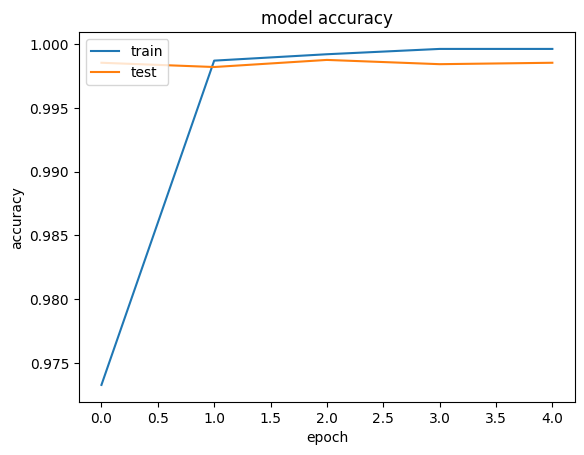

In [95]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

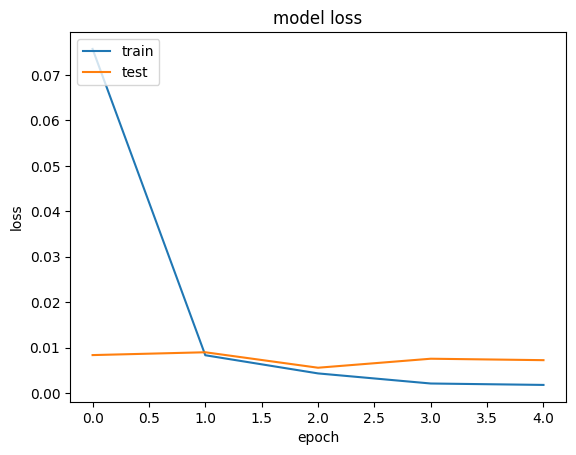

In [96]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show

model is perform well not overfitting and underfitting

In [98]:
loss, acc = model.evaluate(X_test, y_test, verbose=0)
print(f"\nTest Accuracy: {acc*100:.4f}")


Test Accuracy: 99.8775


In [99]:
y_pred=model.predict(X_test)

281/281 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step


In [100]:
print(y_pred.shape)

(8980, 1)


In [104]:
y_pred[0]*100

array([99.987015], dtype=float32)

In [106]:
print(y_pred)

[[9.9987018e-01]
 [1.3978235e-04]
 [1.0951903e-04]
 ...
 [9.9989176e-01]
 [1.1651223e-04]
 [9.3490125e-05]]


In [107]:
pred_classes = (y_pred > 0.5).astype("int32")

In [109]:
pred_classes[0]

array([1], dtype=int32)

array[1]=> real news

array[0]=> fake news

In [112]:
from sklearn.metrics import confusion_matrix
conf_mat=confusion_matrix(y_test, pred_classes)

In [113]:
print(conf_mat)

[[4665    4]
 [   7 4304]]


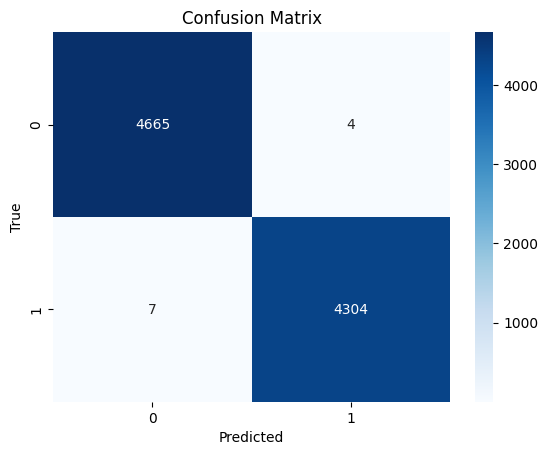

In [115]:
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Building the predicting system

In [116]:
text_input=input("enter the text")

enter the text"The government has announced new economic reforms today."


In [119]:
text=lower(text_input)
print(text)

"the government has announced new economic reforms today."


In [120]:
text=clean_text(text)
print(text)

the government has announced new economic reforms today


In [121]:
text=remove_space(text)
print(text)

the government has announced new economic reforms today


In [122]:
text=tokenizer.texts_to_sequences([text])
print(text)

[[2, 74, 22, 577, 59, 363, 1708, 364]]


In [123]:
text_seq=pad_sequences(text,maxlen=max_len,padding='post',truncating='post')
print(text_seq)

[[   2   74   22  577   59  363 1708  364    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0   

In [124]:
preict=model.predict(text_seq)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


In [125]:
print(preict)

[[0.00013358]]


In [127]:
pred_classes = (preict > 0.5).astype("int32")

In [131]:
print(pred_classes[0][0])

0


In [132]:
if pred_classes[0][0]==1:
  print("real news")
else:
  print("fake news")

fake news


to create a function

In [138]:
real_news_example = "WASHINGTON (Reuters) - President Donald Trump on Wednesday nominated Judge Neil Gorsuch of the 10th U.S. Circuit Court of Appeals to the Supreme Court, picking a conservative to fill a vacancy that has been open for nearly a year."
prediction = predict_news(real_news_example)
print(f"Prediction for a real news example: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Prediction for a real news example: real news


In [136]:
def predict_news(text):
  # Preprocess the text
  text = lower(text)
  text = clean_text(text)
  text = remove_space(text)

  # Convert text to sequence and pad
  text_seq = tokenizer.texts_to_sequences([text])
  text_seq = pad_sequences(text_seq, maxlen=max_len, padding='post', truncating='post')

  # Predict using the model
  prediction = model.predict(text_seq)

  # Determine the class (fake or real)
  pred_class = (prediction > 0.5).astype("int32")

  if pred_class[0][0] == 1:
    return "real news"
  else:
    return "fake news"

In [ ]:
# Test the prediction function with examples
examples = [
    "Breaking: Scientists discover a new planet that could support human life.",
    "The local mayor inaugurated a new hospital in the downtown area today.",
    "A celebrity claims to have traveled back in time using a secret machine.",
    "The stock market saw a significant rise after the central bank reduced interest rates.",
    "Reports suggest that chocolate cures all diseases if eaten daily."
]

for i, text in enumerate(examples, 1):
    prediction = predict_news(text)
    print(f"Prediction for example {i}: {prediction}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
Prediction for example 1: fake news
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Prediction for example 2: fake news
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Prediction for example 3: fake news
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Prediction for example 4: fake news
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Prediction for example 5: fake news


Save the model

In [139]:
model.save("fake_news_model.h5")

In [140]:
# 2. Save tokenizer
import pickle
with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)

print("✅ Model and tokenizer saved successfully!")


✅ Model and tokenizer saved successfully!
